In [10]:
#contains functions for pull requests and executes the pull of all players' match data in diamond 1

import requests
import json
import time

API_KEY = "RGAPI-e7fdac0b-501b-4d40-9e7e-bf204193e530"
REGION = "na1"

def RequestSumData(sumName):
    URL = "https://" + REGION + ".api.riotgames.com/tft/summoner/v1/summoners/by-name/" + sumName + "?api_key=" + API_KEY
    response = requests.get(URL)
    #print(response.status_code)
    response = response.json()
    puuid = response["puuid"]
    return puuid
    
def RequestMatchData(puuid):
    URL = "https://americas.api.riotgames.com/tft/match/v1/matches/by-puuid/" + puuid + "/ids" + "?api_key=" + API_KEY
    response = requests.get(URL)
    response = response.json()
    return response
    
def RequestSpecificMatchData(matchID):
    URL = "https://americas.api.riotgames.com/tft/match/v1/matches/" + matchID + "?api_key=" + API_KEY
    response = requests.get(URL)
    response = response.json()
    return response

        
def GetSumsInLeague(league, rank, page):
    URL = "https://" + REGION + ".api.riotgames.com/tft/league/v1/entries/" + league + "/" + rank + "?page=" + page + "&api_key=" + API_KEY
    response = requests.get(URL)
    response = response.json()
    return response




uniqueMatchIDs = set()
matchIDs = []
uniqueMatchInfo = []
print("check")
data = GetSumsInLeague("DIAMOND", "I", "1")
testData = data[0:10]
for summoner in data:
    #wait for a bit so we dont hit the pull request limit
    time.sleep(30)
    print(summoner["summonerName"])
    puuid = RequestSumData(summoner["summonerName"])
    matches = RequestMatchData(puuid)
    for match in matches:
        matchIDs.append(match)
        if match not in uniqueMatchIDs:
            uniqueMatchIDs.add(match)
            uniqueMatchInfo.append(RequestSpecificMatchData(match))
print(uniqueMatchInfo)










check
TheWaterBearr
Treebeard TwTv
ttv influrrier
SelectMaple
Waakzaamheid
OPPA JIWOO
Kalsuo
trikpi
LOGAN  0   LOGAN
SkySworn TFT
Luuan
robinsongz
Sojii
SoLegit
xoxorainbow
Mister Lau
The Worst Anivia
Kled Bundy
Sphinx
godp3
COng MOer
Pawnup
Attack
Ralliartt
El ChapoSticks
AriesTFT
Tinkady
Lenom
Gravy757
JinxedJK
dildoids
wzc
Mixiu
Enigmackerel
yellowwwwwwwwww
Nhân Tâm
JayGeBee
Rekk
Semipiternity
Flashbâng
Turn1Delver
Zhua Wo Si Ge Ma
qieqie
Doublezzzz
ttv Ezkillar1234
[{'metadata': {'data_version': '3', 'match_id': 'NA1_3224494080', 'participants': ['gYF5GWKQ6jjgdYmvOiJTXJGeg1PPoX0ll4qW5z9H968HRShvWbVijrgbUdaDb0oj3q98eew2SkAYsg', 'bjEi2RTg9HjsDWAxzGGQejvQOzJRQXI70muVBBxD4WZGhWeZBCInAcp9YVukX_7D8MgOWnembSMlug', 'UJnVCHmZIKCihVYoSR1C1JLS0RyZCHbfMHwNzVG26NtmSEj1sPDy0NP942EmVO58x68FjwrOTWZdXw', '3BWF_O-Gx-Bp3xw_bOhcx_JQ28MNXlAChV3oV-Oqp6Io-pQx5ja60fwXs3dS2N5ScFWDWJwHpXCkJQ', '9FPRQTT4UNB_H-JJMpl63JfjWKt1X8NW9ji42FY7MRIiRnxnj3h-YGJPUPlpXVyReMEH_eBkYd-FjA', 'hUi_pDUdmG3cOWRkB6z3J52edMVco0kh

In [15]:
print(len(uniqueMatchIDs))
print(len(matchIDs))


663
900


In [16]:
#creates the big array of comps for the top 3 placements in each game

bigArray = []
count = 0
for game in uniqueMatchInfo:
    matchDict = {}
    count = count + 1
    
    for participant in game["info"]["participants"]:
        if participant["placement"] <= 3:
            #print(participant["traits"])
            synergies = {}
            
            for trait in participant["traits"]:
                if trait["tier_current"] > 0:
                    synergies[trait["name"]] = trait["style"]
            #print(synergies)
            matchDict[participant["placement"]] = synergies
            
    bigArray.append(matchDict)
print(bigArray)
print(count)

[{3: {'Inferno': 1, 'Mystic': 1, 'Set2_Blademaster': 1, 'Set2_Ranger': 1, 'Shadow': 3, 'Summoner': 1}, 2: {'Alchemist': 3, 'Light': 1, 'Mystic': 1, 'Ocean': 1, 'Summoner': 1, 'Warden': 1}, 1: {'Desert': 1, 'Druid': 3, 'Mystic': 1, 'Set2_Assassin': 1, 'Woodland': 3}}, {3: {'Desert': 3, 'Mystic': 1, 'Set2_Blademaster': 2, 'Wind': 1}, 1: {'Alchemist': 3, 'Electric': 2, 'Poison': 3, 'Set2_Assassin': 1}, 2: {'Alchemist': 3, 'Avatar': 3, 'Electric': 2, 'Inferno': 1, 'Mystic': 1, 'Summoner': 1}}, {3: {'Alchemist': 3, 'Avatar': 3, 'Crystal': 3, 'Poison': 3, 'Predator': 3, 'Set2_Glacial': 1, 'Set2_Ranger': 1}, 1: {'Alchemist': 3, 'Inferno': 1, 'Mystic': 1, 'Ocean': 2, 'Summoner': 1, 'Warden': 1}, 2: {'Avatar': 3, 'Mage': 1, 'Mystic': 1, 'Ocean': 3, 'Warden': 1}}, {3: {'Desert': 1, 'Metal': 1, 'Mystic': 1, 'Set2_Blademaster': 2, 'Wind': 1}, 1: {'Avatar': 3, 'Desert': 1, 'Druid': 3, 'Mystic': 1, 'Ocean': 1, 'Set2_Assassin': 1, 'Woodland': 3}, 2: {'Mage': 1, 'Mountain': 3, 'Mystic': 1, 'Ocean': 2,

[{3: 'Inferno Mystic Set2_Blademaster Set2_Ranger Shadow Summoner ', 2: 'Light Mystic Ocean Summoner Warden ', 1: 'Desert Druid Mystic Set2_Assassin Woodland '}, {3: 'Desert Mystic Set2_Blademaster Wind ', 1: 'Electric Poison Set2_Assassin ', 2: 'Electric Inferno Mystic Summoner '}, {3: 'Crystal Poison Predator Set2_Glacial Set2_Ranger ', 1: 'Inferno Mystic Ocean Summoner Warden ', 2: 'Mage Mystic Ocean Warden '}, {3: 'Desert Metal Mystic Set2_Blademaster Wind ', 1: 'Desert Druid Mystic Ocean Set2_Assassin Woodland ', 2: 'Mage Mountain Mystic Ocean Warden '}, {3: 'Metal Poison Predator ', 2: 'Berserker Electric Inferno Poison Set2_Glacial Warden ', 1: 'Light Mystic Ocean Summoner Warden '}, {1: 'Mage Mountain Mystic Ocean Warden ', 2: 'Mage Ocean Summoner ', 3: 'Crystal Poison Predator Set2_Ranger '}, {1: 'Crystal Metal Poison Predator Set2_Ranger ', 3: 'Inferno Set2_Ranger Shadow Summoner ', 2: 'Inferno Mage Mystic Ocean Summoner '}, {3: 'Berserker Electric Poison Set2_Glacial Warden 

<BarContainer object of 4 artists>

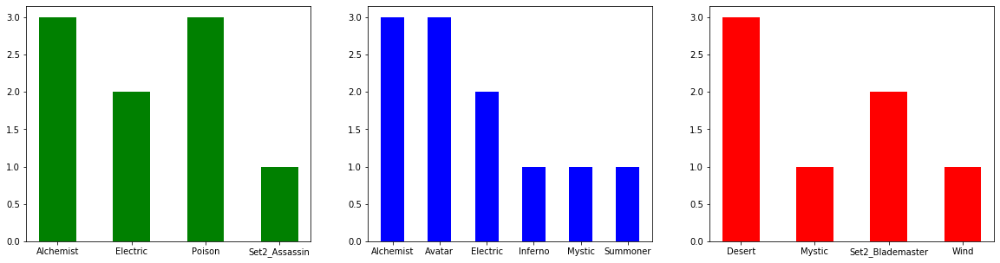

In [201]:
#syyles the data and produces a representation

import numpy as np
import matplotlib.pyplot as plt
finalArray = []
for game in bigArray:
    matchDict = {}
    for place in game:
        
        Comp = ""
        for synergy in game[place]:
            #removes unique synergies that do not make sense for data
            if synergy!='Alchemist' and synergy!='Avatar':
                if game[place][synergy]==3 or 2:
                    Comp = Comp + synergy + " "
        matchDict[place] = Comp
    finalArray.append(matchDict)
    
print(finalArray)
test = bigArray[1]
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(20,5))
ax1.bar(test[1].keys(), test[1].values(),.5, color='g')
ax2.bar(test[2].keys(), test[2].values(),.5, color='b')
ax3.bar(test[3].keys(), test[3].values(),.5, color='r')

In [127]:
#condenses winners in a dictionary with comps beaten


from collections import defaultdict

my_dict = {}
for game in finalArray:
    if not bool(my_dict):
        my_dict[game[1]] = [game[2],game[3]]
    if game[1] not in my_dict.keys():
        base = game[1].split()
        found = False
        for key in my_dict:
            count = 0
            compare = key.split()
            for word in base:
                for word2 in compare:
                    if word == word2:
                        
                        count = count + 1
            if count > 2:
                
                my_dict[key].append(game[2])
                my_dict[key].append(game[3])
                found = True
                
        if found == False:
            my_dict[game[1]] = [game[2],game[3]]
    else:
        my_dict[game[1]].append(game[2])
        my_dict[game[1]].append(game[3])
    
print(len(my_dict.keys()))

42


In [155]:
#Reducing arrays to known comps

from collections import Counter
winners = my_dict.keys()
for match in my_dict:
    arr = my_dict[match]
    newArr = []
    found = False
    for comp in arr:
        base = comp.split()
        for comp2 in winners:
            compare = comp2.split()
            count = 0
            for word in base:
                for word2 in compare:
                    if word == word2:
                        count = count + 1
            if count > 2:
               
                newArr.append(comp2)
                found = True
        if found == False:
            newArr.append(comp)
    my_dict[match] = newArr


dict_keys(['Desert Druid Mystic Set2_Assassin Woodland ', 'Electric Poison Set2_Assassin ', 'Inferno Mystic Ocean Summoner Warden ', 'Crystal Metal Poison Predator Set2_Ranger ', 'Light Mystic Set2_Blademaster Set2_Ranger Shadow ', 'Berserker Electric Set2_Glacial Set2_Ranger Shadow ', 'Electric Mystic Poison ', 'Electric Mystic Ocean ', 'Desert Metal Mountain Predator Set2_Assassin ', 'Electric Light Mystic Summoner ', 'Mystic Poison Predator ', 'Electric Poison Predator Set2_Glacial ', 'Light Mystic Warden Wind ', 'Ocean Warden ', 'Light Ocean Poison Summoner ', 'Mage Ocean Summoner ', 'Ocean Poison Warden ', 'Mystic Summoner ', 'Mystic Ocean Poison ', 'Wind ', 'Electric Inferno Set2_Assassin Summoner Wind ', 'Desert Metal Mystic Set2_Blademaster Wind ', 'Poison Predator ', 'Druid Mage Ocean Warden Woodland ', 'Inferno Mage Ocean Poison ', 'Desert Set2_Blademaster Summoner ', 'Berserker Mystic Poison Set2_Glacial ', 'Desert Ocean Set2_Assassin Summoner ', 'Inferno Set2_Ranger Shadow 

In [200]:
#Get top 5 winners
winnersArr = []
winsArr = []
lossArr = []
for winner in my_dict:
    winnersArr.append(winner)
    winsArr.append((len(my_dict[winner]),winner))

sortedArr = sorted(winsArr,reverse=True)
print(Counter(my_dict['Desert Druid Mystic Set2_Assassin Woodland ']))
for winner in sortedArr[0:5]:
    sortedLoss =[]
    lossArr = []
    temp = Counter(my_dict[winner[1]])
    for loser in temp:
        lossArr.append((temp[loser],loser))
    sortedLoss = sorted(lossArr,reverse=True)
    print('WINNER:' +winner[1])
    print('LOSERS:')
    for tup in sortedLoss[0:5]:
        print(tup[1])
    print("________________________________________________________________")
print(sorted(lossArr,reverse=True))
    

Counter({'Inferno Mystic Ocean Summoner Warden ': 129, 'Mage Ocean Summoner ': 69, 'Inferno Mage Ocean Poison ': 65, 'Druid Mage Ocean Warden Woodland ': 50, 'Desert Druid Mystic Set2_Assassin Woodland ': 49, 'Desert Metal Mystic Set2_Blademaster Wind ': 34, 'Desert Metal Mountain Predator Set2_Assassin ': 31, 'Crystal Metal Poison Predator Set2_Ranger ': 29, 'Light Mystic Set2_Blademaster Set2_Ranger Shadow ': 23, 'Inferno Set2_Ranger Shadow Summoner ': 22, 'Mage Mystic Ocean Shadow ': 22, 'Desert Ocean Set2_Assassin Summoner ': 22, 'Light Ocean Poison Summoner ': 19, 'Mystic Poison Set2_Assassin Set2_Blademaster ': 17, 'Inferno Mystic Shadow ': 16, 'Electric Light Mystic Summoner ': 15, 'Berserker Electric Set2_Glacial Set2_Ranger Shadow ': 14, 'Electric Poison Predator Set2_Glacial ': 13, 'Electric Inferno Set2_Assassin Summoner Wind ': 11, 'Berserker Mystic Poison Set2_Glacial ': 10, 'Light Mystic Warden Wind ': 9, 'Electric Mystic Set2_Glacial Warden ': 8, 'Ocean Poison Warden ': 

In [89]:
testData = GetAllMatches("Snerx")

In [104]:
#testing what the data looks like with my account

for i in testData["info"]["participants"]:
    print(i["placement"])
    if i["placement"] <=3:
        for j in (i["traits"]):
            print(j)
            #print(j["name"])
            #print(j["tier_current"])


7
6
2
{'name': 'Druid', 'num_units': 2, 'style': 3, 'tier_current': 1, 'tier_total': 1}
{'name': 'Inferno', 'num_units': 2, 'style': 0, 'tier_current': 0, 'tier_total': 3}
{'name': 'Mage', 'num_units': 6, 'style': 3, 'tier_current': 2, 'tier_total': 2}
{'name': 'Mountain', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 1}
{'name': 'Ocean', 'num_units': 2, 'style': 1, 'tier_current': 1, 'tier_total': 3}
{'name': 'Set2_Assassin', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 2}
{'name': 'Shadow', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 2}
{'name': 'Summoner', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 2}
{'name': 'Woodland', 'num_units': 3, 'style': 3, 'tier_current': 1, 'tier_total': 1}
5
8
1
{'name': 'Desert', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 2}
{'name': 'Electric', 'num_units': 1, 'style': 0, 'tier_current': 0, 'tier_total': 3}
{'name': 'Inferno', 'num_units': 3, 'style': 1, 'tier_current':